# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Library-Loading" data-toc-modified-id="Library-Loading-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Library Loading</a></div><div class="lev1 toc-item"><a href="#Compute-the-camera-calibration-matrix-and-distortion-coefficients-given-a-set-of-chessboard-images." data-toc-modified-id="Compute-the-camera-calibration-matrix-and-distortion-coefficients-given-a-set-of-chessboard-images.-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.</a></div><div class="lev1 toc-item"><a href="#Apply-a-distortion-correction-to-raw-images." data-toc-modified-id="Apply-a-distortion-correction-to-raw-images.-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Apply a distortion correction to raw images.</a></div><div class="lev1 toc-item"><a href="#Use-color-transforms,-gradients,-etc.,-to-create-a-thresholded-binary-image." data-toc-modified-id="Use-color-transforms,-gradients,-etc.,-to-create-a-thresholded-binary-image.-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Use color transforms, gradients, etc., to create a thresholded binary image.</a></div><div class="lev2 toc-item"><a href="#Use-Magnitude-Gradients-(Sobel)" data-toc-modified-id="Use-Magnitude-Gradients-(Sobel)-41"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Use Magnitude Gradients (Sobel)</a></div><div class="lev2 toc-item"><a href="#Color-threshold" data-toc-modified-id="Color-threshold-42"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Color threshold</a></div><div class="lev2 toc-item"><a href="#Direction-gradients" data-toc-modified-id="Direction-gradients-43"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Direction gradients</a></div><div class="lev2 toc-item"><a href="#Color-Threshold-(HLS)" data-toc-modified-id="Color-Threshold-(HLS)-44"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Color Threshold (HLS)</a></div><div class="lev2 toc-item"><a href="#Conclusion" data-toc-modified-id="Conclusion-45"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Conclusion</a></div><div class="lev1 toc-item"><a href="#Apply-a-perspective-transform-to-rectify-binary-image-(&quot;birds-eye-view&quot;)" data-toc-modified-id="Apply-a-perspective-transform-to-rectify-binary-image-(&quot;birds-eye-view&quot;)-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Apply a perspective transform to rectify binary image ("birds-eye view")</a></div><div class="lev2 toc-item"><a href="#Extract-a-ROI(Region-of-Interest)" data-toc-modified-id="Extract-a-ROI(Region-of-Interest)-51"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Extract a ROI(Region of Interest)</a></div><div class="lev2 toc-item"><a href="#Transform-a-perspective" data-toc-modified-id="Transform-a-perspective-52"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Transform a perspective</a></div><div class="lev2 toc-item"><a href="#Conclusion" data-toc-modified-id="Conclusion-53"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Conclusion</a></div><div class="lev1 toc-item"><a href="#Detect-lane-pixels-and-fit-to-find-the-lane-boundary" data-toc-modified-id="Detect-lane-pixels-and-fit-to-find-the-lane-boundary-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Detect lane pixels and fit to find the lane boundary</a></div><div class="lev2 toc-item"><a href="#Sliding-window-(Using-Convolution)" data-toc-modified-id="Sliding-window-(Using-Convolution)-61"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Sliding window (Using Convolution)</a></div><div class="lev2 toc-item"><a href="#Sliding-window-(Histogram)" data-toc-modified-id="Sliding-window-(Histogram)-62"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Sliding window (Histogram)</a></div><div class="lev1 toc-item"><a href="#Detecting-Curvature" data-toc-modified-id="Detecting-Curvature-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Detecting Curvature</a></div><div class="lev1 toc-item"><a href="#Final-Pipeline" data-toc-modified-id="Final-Pipeline-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Final Pipeline</a></div>

# Library Loading

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import ipywidgets as widgets

%matplotlib inline
%load_ext cython

In [2]:
# helper function
def plot_two_images(img1, title1, img2, title2):
    """Plot two images side by side
    
    It has no return value but plot two pictures side by side
    
    Parameters
    ----------
    img1 : array_like (H, W, C) or (H, W)
        Original Image
        
    title1 : str
        Title for the original image
        
    img2 : array_like (H, W, C) or (H, W)
        Transformed image
        
    title2 : str
        Title for the transformed image
    """
    plt.figure(figsize=(30, 15))
    plt.subplot(1, 2, 1)

    if len(img1.shape) == 3:
        plt.imshow(img1)
    elif len(img1.shape) == 2:
        plt.imshow(img1, cmap="gray")
    else:
        raise TypeError("Wrong image shape for img1: {}".format(img1.shape))
    plt.title(title1, fontsize=15)

    plt.subplot(1, 2, 2)
    if len(img2.shape) == 3:
        plt.imshow(img2)
    elif len(img2.shape) == 2:
        plt.imshow(img2, cmap="gray")
    else:
        raise TypeError("Wrong image shape for img1: {}".format(img2.shape))
    plt.title(title2, fontsize=15)

    plt.show()

# Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

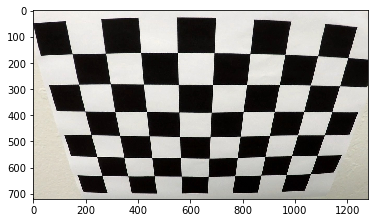

In [3]:
# View a single image
# We can see it's a little distorted
# There are 6 x 9 corners
img = cv2.imread("./camera_cal/calibration2.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img);

In [4]:
# 3-D coordinates for each corner to be placed
target_corner_array = np.zeros((6 * 9, 3), np.float32)
target_corner_array[:, :2] = np.mgrid[0:6, 0:9].T.reshape(-1, 2)
target_corner_array[:10]

array([[ 0.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 2.,  0.,  0.],
       [ 3.,  0.,  0.],
       [ 4.,  0.,  0.],
       [ 5.,  0.,  0.],
       [ 0.,  1.,  0.],
       [ 1.,  1.,  0.],
       [ 2.,  1.,  0.],
       [ 3.,  1.,  0.]], dtype=float32)

In [5]:
target_corner_list = []
actual_corner_list = []

images = glob.glob("./camera_cal/calibration*.jpg")

for idx, f_name in enumerate(images):

    img = cv2.imread(f_name)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    ret, corners = cv2.findChessboardCorners(gray, (6, 9), None)

    if ret:
        target_corner_list.append(target_corner_array)
        actual_corner_list.append(corners)

# Apply a distortion correction to raw images.

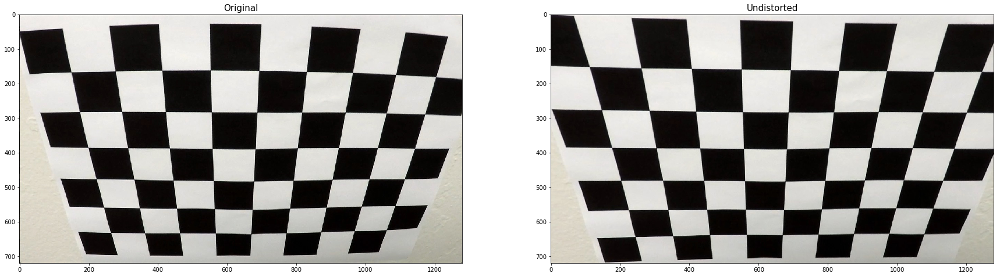

In [6]:
# Let's check calibrated images
idx = 2 # image id

test_img = cv2.imread("./camera_cal/calibration{}.jpg".format(idx))
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
img_size = (test_img.shape[1], test_img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(target_corner_list,
                                                   actual_corner_list,
                                                   img_size, None, None)

def undistort(img):
    return cv2.undistort(img, mtx, dist, None)

dst = undistort(test_img)
plot_two_images(test_img, "Original", dst, "Undistorted")

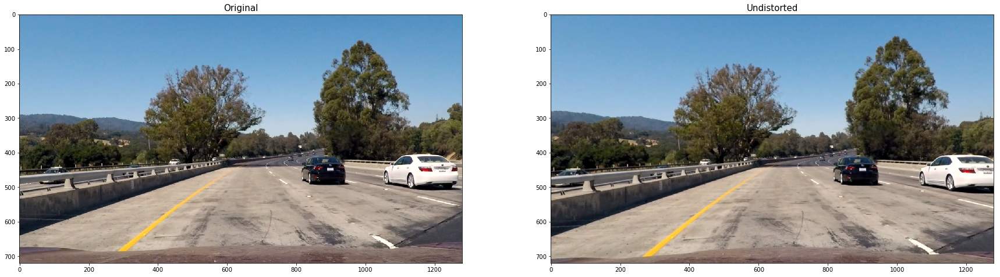

In [7]:
test_img = cv2.imread("./test_images/test1.jpg")
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
test_img_corrected = cv2.undistort(test_img, mtx, dist, None)

plot_two_images(test_img, "Original", test_img_corrected, "Undistorted")

In [8]:
# Helper functions

def read_undist(img_path):
    """Opens an image and returns an undisotred image"""
    global mtx, dist
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    return cv2.undistort(img, mtx, dist, None)

def min_max_scaler(img, max_val=255):
    """Scale an image to [0, max_val]
    
    Every value in the `img` will be between from 0 and `max_val`
    
    Returns
    ----------
    img : array_like (dtype: `np.uint8`)
        Scaled image
    """
    numerator = img - np.min(img)
    denominator = np.max(img) + 1e-8
    
    return np.uint8(numerator / denominator * max_val)

# Use color transforms, gradients, etc., to create a thresholded binary image.

## Use Magnitude Gradients (Sobel)

In [56]:
def apply_sobel_x(img, sobel_kernel, min_threshold, max_threshold):
    """Apply sobel x sobel y gradients
    
    Parameters
    ----------
    img : array_like (H, W, C) or (H, W)
    
    sobel_kernel : int
        Kernel size for a sobel operation
        The higher, the smoother
    
    min_threshold : int
        Minimum threshold should be >= 0
    
    max_threshold : int
        Maximum threshold should be <= 255
    
    Returns
    ----------
    img : 2-D array (H, W)
        Gradient of the given image with sobel threshold
        Hence, it's binarized(black and white)
    """
    shape = img.shape
    if len(shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, None, sobel_kernel)
    #sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, None, sobel_kernel)
    
    magnitude = np.abs(sobel_x)
    magnitude = min_max_scaler(magnitude, 255)
    
    mask = (min_threshold <= magnitude) & (magnitude <= max_threshold)
    
    binary_output = np.zeros_like(gray)
    binary_output[mask] = 1
    
    return binary_output

def apply_sobel_y(img, sobel_kernel, min_threshold, max_threshold):
    """Apply sobel x sobel y gradients
    
    Parameters
    ----------
    img : array_like (H, W, C) or (H, W)
    
    sobel_kernel : int
        Kernel size for a sobel operation
        The higher, the smoother
    
    min_threshold : int
        Minimum threshold should be >= 0
    
    max_threshold : int
        Maximum threshold should be <= 255
    
    Returns
    ----------
    img : 2-D array (H, W)
        Gradient of the given image with sobel threshold
        Hence, it's binarized(black and white)
    """
    shape = img.shape
    if len(shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    
    #sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, None, sobel_kernel)
    sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, None, sobel_kernel)
    
    magnitude = np.abs(sobel)
    magnitude = min_max_scaler(magnitude, 255)
    
    mask = (min_threshold <= magnitude) & (magnitude <= max_threshold)
    
    binary_output = np.zeros_like(gray)
    binary_output[mask] = 1
    
    return binary_output

In [10]:
# Interactive Plot Helper
def interacter_factory(img, fn, **kwargs):
    """Returns a function that can be used with `widgets.interact`
    
    Parameters
    ----------
    img : 3-D array (H, W, C)
        Original Image to apply any transformation
    
    fn : function
        Any transformation function
        
    **kwargs
        Keword arguments for `fn`
        
    Returns
    ----------
    interacter : function
    """
    
    def interacter(**kwargs):
        binarized = fn(img, **kwargs)
        plot_two_images(img, "Original", binarized, "After OP")
        
    return interacter

In [11]:
test_img = read_undist("./test_images/test5.jpg")
interact_sobel = interacter_factory(test_img, apply_sobel_x)

min_slider = widgets.IntSlider(value=20, min=0, max=255)
max_slider = widgets.IntSlider(value=100, min=1, max=255)
kernel_slider = widgets.IntSlider(value=3, min=3, max=3 * 11, step=2)

widgets.interact(interact_sobel,
                 sobel_kernel=kernel_slider,
                 min_threshold=min_slider,
                 max_threshold=max_slider);

# sobel_kerenel = 3
# threshold = (20, 100)
# not really helpful

In [62]:
test_img = read_undist("./test_images/test5.jpg")
interact_sobel = interacter_factory(test_img, apply_sobel_y)

min_slider = widgets.IntSlider(value=20, min=0, max=255)
max_slider = widgets.IntSlider(value=100, min=1, max=255)
kernel_slider = widgets.IntSlider(value=3, min=3, max=3 * 11, step=2)

widgets.interact(interact_sobel,
                 sobel_kernel=kernel_slider,
                 min_threshold=min_slider,
                 max_threshold=max_slider);

# sobel_kerenel = 3
# threshold = (20, 100)
# not really helpful

## Color threshold

In [12]:
    def color_threshold(img, color, min_threshold, max_threshold):
    """Binarize an image by color threshold
    
    Parameters
    ----------
    img : 3-D array (H, W, C)
    
    color : int
        {0, 1, 2, 3}
        {0, 1, 2} stands for {R, G, B}
        3 stands for Grayscale
    
    min_threshold : int
        Between 0 - 255
    
    max_threshold : int
        Between 0 - 255
    
    Returns
    ----------
    binarized : 2-D array (H, W)
        Binarized image        
    """
    if color == 3:
        # grayscale
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        img = img[:, :, color]        
    
    img = min_max_scaler(img, 255)
    
    mask = (min_threshold <= img) & (img <= max_threshold)
    
    binary = np.zeros_like(img)
    binary[mask] = 1
    
    return binary

In [13]:
before_img = read_undist("./test_images/test5.jpg")
interacter_color = interacter_factory(before_img, color_threshold)


min_slider = widgets.IntSlider(value=220, min=0, max=255)
max_slider = widgets.IntSlider(value=255, min=1, max=255)

widgets.interact(interacter_color,
                 color=[0, 1, 2, 3],
                 min_threshold=min_slider,
                 max_threshold=max_slider);

# Set color = 0
# Set threshold = 220, 255

## Direction gradients

In [14]:
def direction_gradient(img, sobel_kernel, min_threshold, max_threshold):
    """Compute the direction of gradients and filter by threshold
    
    Parameters
    ----------
    img : 3-D array (H, W, C)
    
    sobel_kernel : int
        Kernel size for a sobel operation
        The higher, the smoother
    
    min_threshold : float
        Minimum threshold should be >= 0
        which means a horizontal line
    
    max_threshold : float
        Maximum threshold should be <= np.pi / 2,
        which means a vertical line
    
    Returns
    ----------
    img : 2-D array (H, W)
        Binarized image
    """
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, None, sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, None, sobel_kernel)
    
    sobel_x = np.abs(sobel_x)
    sobel_y = np.abs(sobel_y)

    direction = np.arctan2(sobel_y, sobel_x)

    mask = (min_threshold <= direction) & (direction <= max_threshold)
    
    binary_output = np.zeros_like(gray)
    binary_output[mask] = 1
    
    return binary_output

In [15]:
direction_interacter = interacter_factory(before_img, direction_gradient)

min_slider = widgets.FloatSlider(value=0.3, min=0, max=np.pi/2, step=0.1)
max_slider = widgets.FloatSlider(value=1.1, min=0, max=np.pi/2, step=0.1)
kernel_slider = widgets.IntSlider(value=13, min=3, max=3 * 11, step=2)

widgets.interact(direction_interacter,
                 sobel_kernel=kernel_slider,
                 min_threshold=min_slider,
                 max_threshold=max_slider);

# Hmm, I see too much noise using the direction
# sobel_kernel = 13
# threshold = (0.3, 1.1)

## Color Threshold (HLS)

In [16]:
def HLS_threshold(img, color, min_threshold, max_threshold):
    """Binarize an image by color threshold
    
    Parameters
    ----------
    img : 3-D array (H, W, C)
    
    color : str
        {'H', 'L', 'S'}        
    
    min_threshold : int
        Between 0 - 255
    
    max_threshold : int
        Between 0 - 255
    
    Returns
    ----------
    binarized : 2-D array (H, W)
        Binarized image        
    """
    color_dict = {
        'H': 0,
        'L': 1,
        'S': 2
    }
    
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    img = img[:, :, color_dict[color]]
    
    img = min_max_scaler(img, 255)
    
    mask = (min_threshold <= img) & (img <= max_threshold)
    
    binary = np.zeros_like(img)
    binary[mask] = 1
    
    return binary

In [17]:
before_img = read_undist("./test_images/test5.jpg")
interacter_HLS = interacter_factory(before_img, HLS_threshold)

min_slider = widgets.IntSlider(value=230, min=0, max=255)
max_slider = widgets.IntSlider(value=255, min=1, max=255)

widgets.interact(interacter_HLS,
                 color=['S', 'H', 'L'],
                 min_threshold=min_slider,
                 max_threshold=max_slider);

# Color = S
# Threshold = (230, 255) is good for yellow

# Color = L
# Threshold = (230, 255) seems very good for white

## Conclusion

I selected 3 following color/gradients transforms

- RED Channel in the RGB space with thresholds between (220, 255)
- S channel in the HLS space with thresholds between (220, 255)
- L channel in the HLS space with thresholds between (220, 255)

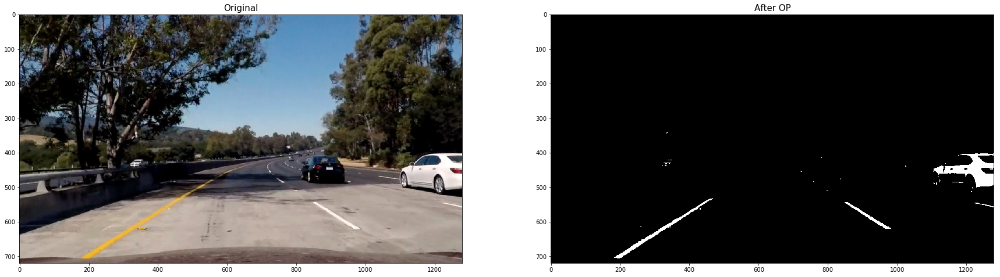

In [18]:
# my choice 1 Red channel (220, 255)
interacter_color(color=0, min_threshold=220, max_threshold=255)

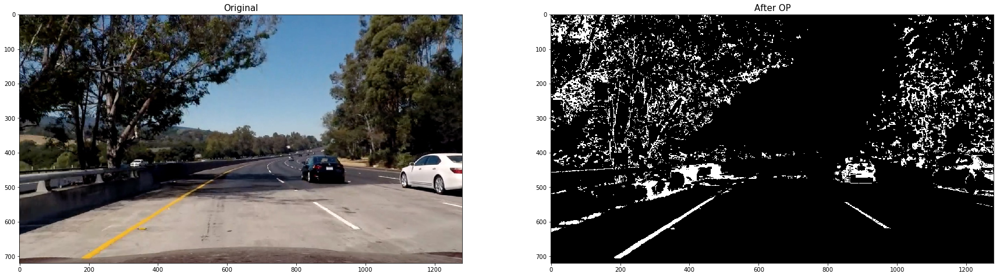

In [19]:
# Saturation (230, 255) for Yellow Line
interacter_HLS(color="S", min_threshold=150, max_threshold=255)

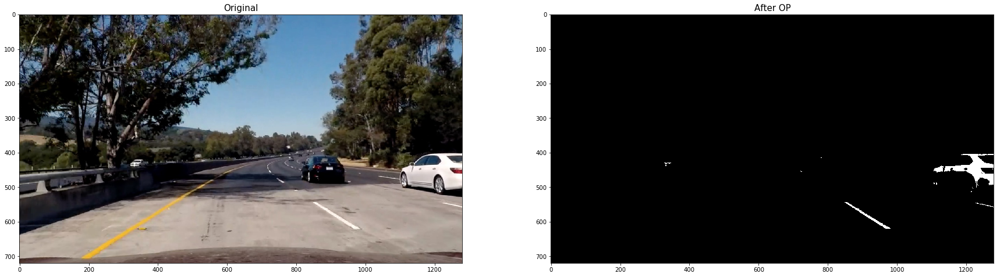

In [20]:
# Light (230, 255) for White line
interacter_HLS(color="L", min_threshold=230, max_threshold=255)

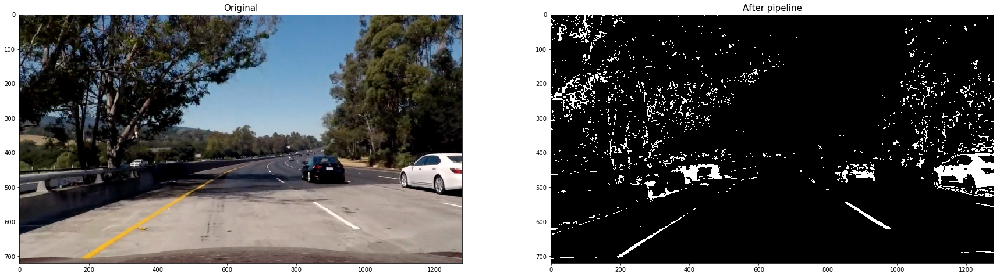

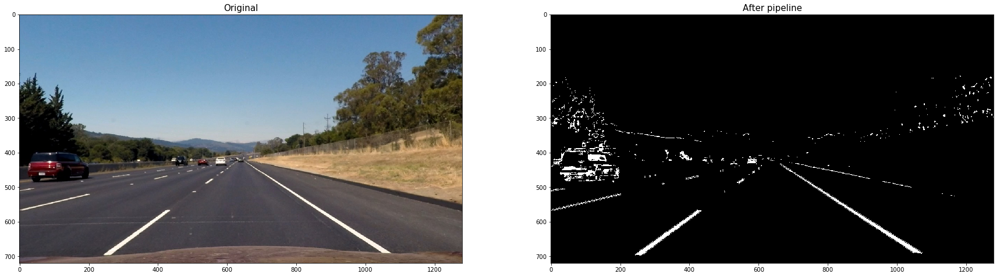

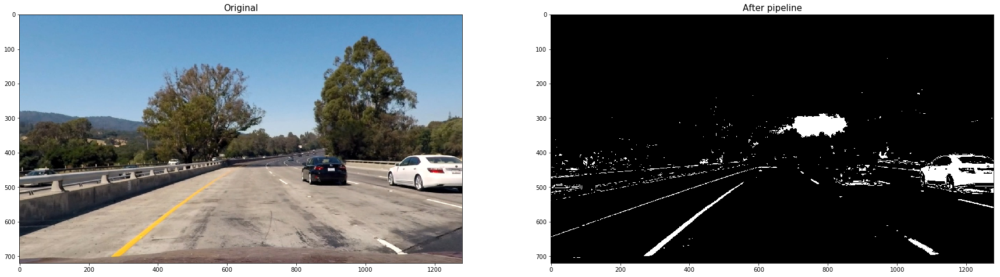

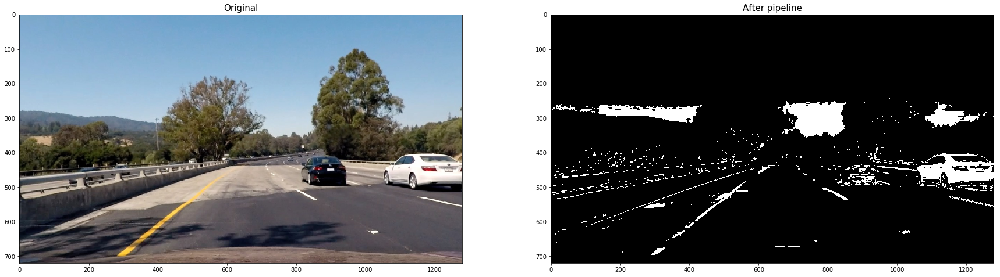

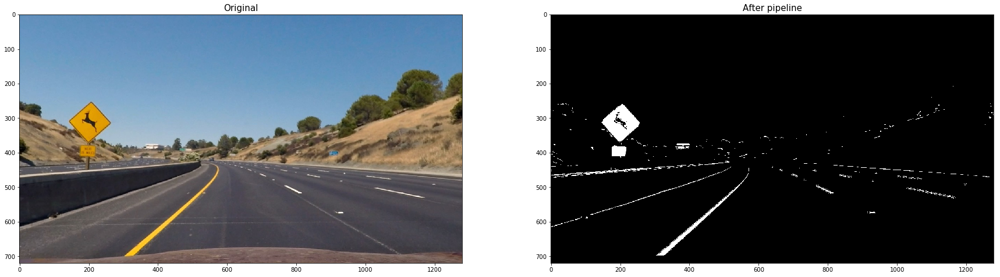

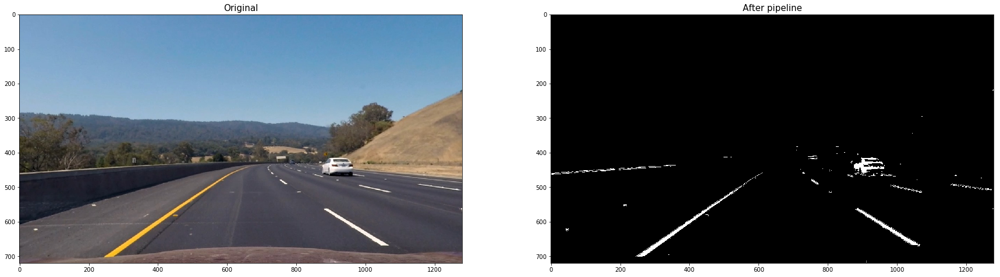

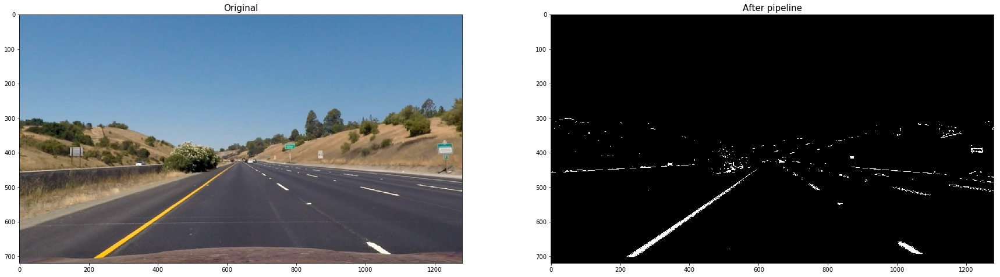

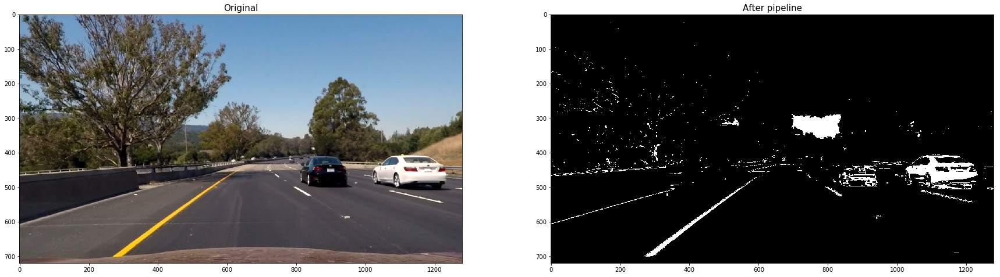

In [80]:
# Final pipeline
def transform_pipeline(image):
    image = cv2.GaussianBlur(image, (3, 3), 0)
    #image_1 = color_threshold(image, color=0, min_threshold=195, max_threshold=255)
    ## sobel_kerenel = 17 threshold = (31, 255)
    image_1 = apply_sobel_x(image, 3, 170, 255)
    image_2 = apply_sobel_y(image, 3, 100, 150)
    image_3 = HLS_threshold(image, color='S', min_threshold=200, max_threshold=255)
    image_4 = HLS_threshold(image, color='L', min_threshold=200, max_threshold=255)
    mix = np.array([image_1, image_2, image_3, image_4])
    
    assert image.shape[:-1] == mix.shape[1:], "{} != {}".format(image.shape, mix.shape)
    
    mix = mix.sum(0)    
    binary = np.zeros_like(mix, dtype=np.uint8)
    binary[mix > 0] = 1
    #binary = apply_sobel_x(binary, 9, 70, 200)
    
    assert len(binary.shape) == 2, "{} is not 2-D".format(binary.shape)
    return binary

img_list = glob.glob("./test_images/*.jpg")
for img in img_list:
    before_img = read_undist(img)
    after_img = transform_pipeline(before_img)
    plot_two_images(before_img, "Original", after_img, "After pipeline")

# Apply a perspective transform to rectify binary image ("birds-eye view")

## Extract a ROI(Region of Interest)

- This function is replaced by the `warpPerspective`
- This is used for searching `src` and `dst` points

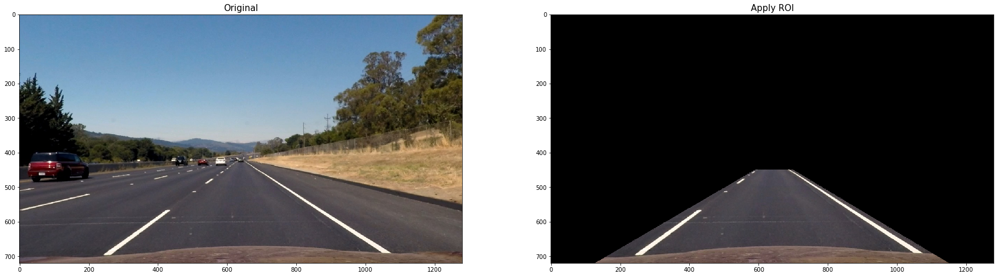

In [77]:
def extract_ROI(image, points):
    """Mask the image outside of points

    Parameters
    ----------
    image : array_like (H, W, C) or (H, W)
    points : array_like (1, N, 2)
        np.array([[point1, point2, ..., point4]])
        where point1 is a tuple of (x, y)

    Returns
    ----------
    image : array_like (same shape as `image`)    
    """
    
    shape = image.shape
    dim = len(shape)
    
    assert 2 <= dim <= 3, "Wrong dimension: {}".format(dim)
    
    mask = np.zeros_like(image, dtype=np.uint8)
    
    if dim == 3:
        H, W, C = shape
        
    else:
        H, W = shape
        C = 1
        
    color = (255,) * C
    points = np.array([points], dtype=np.int32)
    cv2.fillPoly(mask, points, color)
    
    return cv2.bitwise_and(image, mask)

test_image = read_undist("./test_images/straight_lines2.jpg")

src = [[590, 450], [W*0.1, H], [1150, H], [700, 450]]
new_image = extract_ROI(test_image, src)

plot_two_images(test_image, "Original", new_image, "Apply ROI")

## Transform a perspective

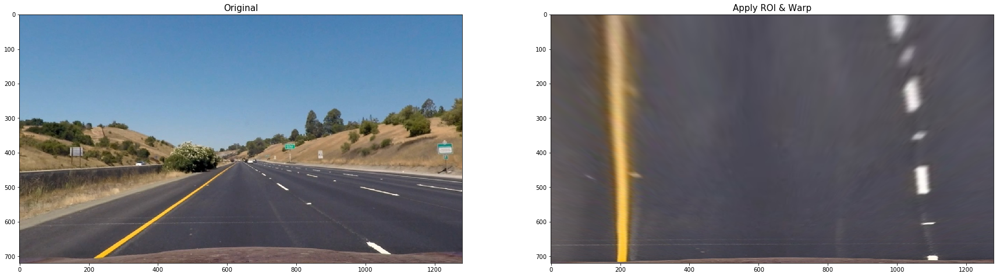

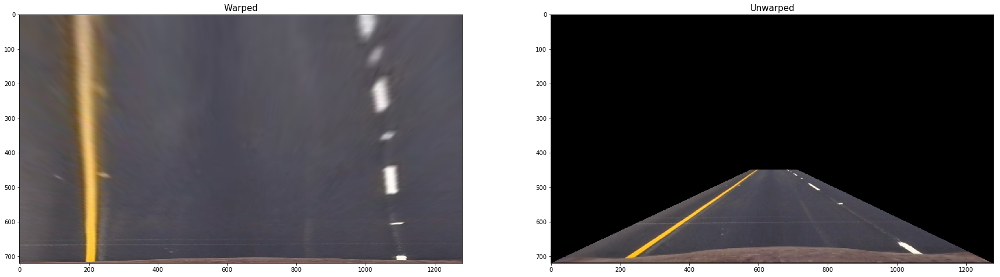

In [81]:
def make_warp_factory():
    """Returns a warper function and an unwarper function
    
    src --> dst
    585, 460	320, 0
    203, 720	320, 720
    1127, 720	960, 720
    695, 460	960, 0

    """
    # src = [[585, 460], [203, 720], [1127, 720], [695, 460]]
    W = 1280
    H = 720
    src = [[590, 450], [W*0.1, H], [1150, H], [700, 450]]
    dst = [[W*0.1, 0], [W*0.1, 720], [W*0.9, 720], [W*0.9, 0]]    
    
    src = np.array([src], dtype=np.float32)
    dst = np.array([dst], dtype=np.float32)

    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    
    def warp_image(image):
        
        shape = image.shape

        if len(shape) == 3:
            H, W, C = shape
        elif len(shape) == 2:
            H, W = shape
        else:
            raise TypeError("Wrong image shape is given: {}".format(image.shape))

        return cv2.warpPerspective(image, M, (W, H), flags=cv2.INTER_LINEAR)
    
    def unwarp_image(image):
        shape = image.shape

        if len(shape) == 3:
            H, W, C = shape
        elif len(shape) == 2:
            H, W = shape
        else:
            raise TypeError("Wrong image shape is given: {}".format(image.shape))

        return cv2.warpPerspective(image, M_inv, (W, H), flags=cv2.INTER_LINEAR)
    
    return warp_image, unwarp_image

test_image = read_undist("./test_images/straight_lines1.jpg")
H, W, C = test_image.shape

warper, unwarper = make_warp_factory()

warped_image = warper(test_image)
plot_two_images(test_image, "Original", warped_image, "Apply ROI & Warp")

unwarped_image = unwarper(warped_image)
plot_two_images(warped_image, "Warped", unwarped_image, "Unwarped")

## Conclusion

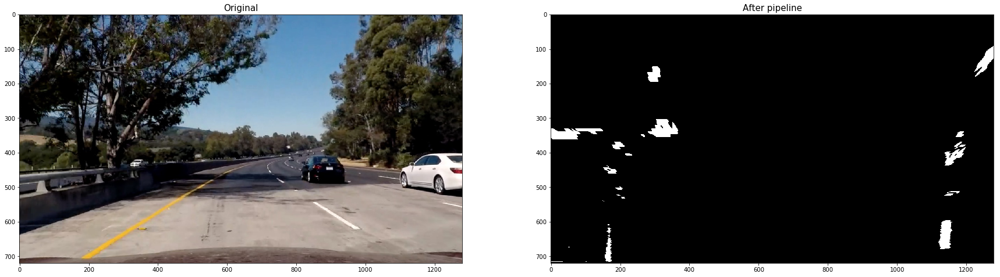

In [82]:
test_image = read_undist("./test_images/test5.jpg")

def transform_ROI_warp(image):
    H, W, C = image.shape
    warped_image = transform_pipeline(image)
    return warper(warped_image)

plot_two_images(test_image, "Original", transform_ROI_warp(test_image), "After pipeline")

# Detect lane pixels and fit to find the lane boundary

## Sliding window (Using Convolution)

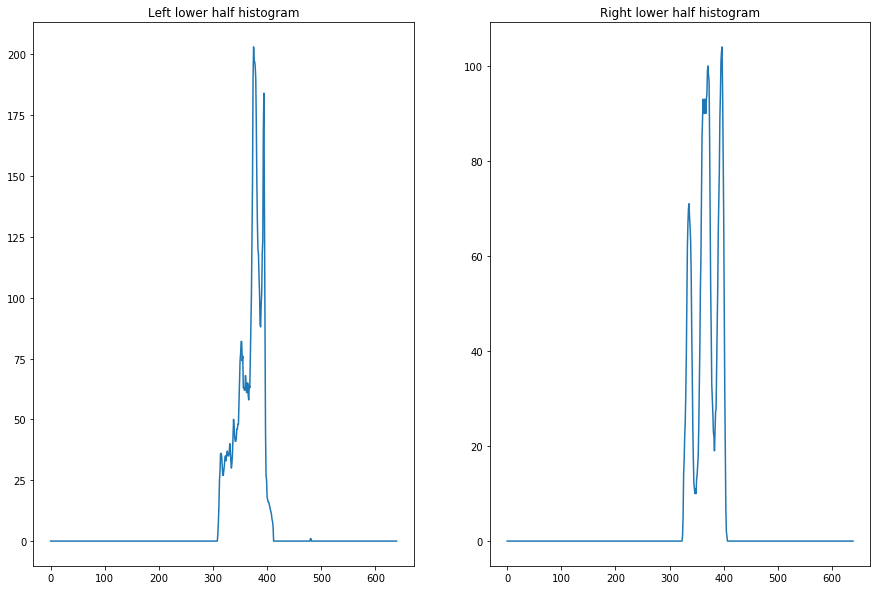

In [25]:
test_image = read_undist("./test_images/test2.jpg")
warped_image = transform_ROI_warp(test_image)

# plot histogram
H, W = warped_image.shape
H_breakpoint = int(H * 0.5)
W_breakpoint = int(W * 0.5)

left_hist = np.sum(warped_image[H_breakpoint:, :W_breakpoint], axis=0)
right_hist = np.sum(warped_image[H_breakpoint:, W_breakpoint:], axis=0)

plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.plot(left_hist)
plt.title("Left lower half histogram")

plt.subplot(1, 2, 2)
plt.plot(right_hist)
plt.title("Right lower half histogram")

In [26]:
%%cython

import numpy as np
import cv2
cimport numpy as np

cdef window_mask(int width, int height, np.ndarray img_ref, float center, int level):
    """Returns a convolution filter size (width, height)

    It is a big matrix (H, W) but only filter portion is 1

    Parameters
    ----------
    width, height : int
        Window size

    img_ref : 2-D np.array (H, W)
        Original Image

    center : float
        x-coordinate for the center of convolution filter

    level : int
        Level from 0(lower portion of image) to 8(upper portion of image)

    Returns
    ----------
    output : 2-D np.array (H, W)
        Binarized image (filter)
    """
    cdef int H, W
    H, W = np.shape(img_ref)
    output = np.zeros((H, W))

    H_beg = int(H - (level + 1) * height)
    H_end = int(H - level * height)

    W_beg = max(0, int(center - width / 2))
    W_end = min(int(center + width / 2), W)

    output[H_beg:H_end, W_beg:W_end] = 1

    return output


cdef find_window_centroids(np.ndarray image, int window_width, int window_height, int margin):
    """Finds centroids for windows

    Parameters
    ----------
    image : 2-D np.array (H, W)
    window_width : int
    window_height : int
    margin : int

    Returns
    ----------
    window_centroids : list
        [centroid_1, centroid_2, ...]
        where centroid_1 is a tuple of (l_center, r_center)
    """
    cdef int H, W
    cdef int H_beg, H_end
    cdef float offset
    cdef int l_min_index, l_max_index
    cdef int r_min_index, r_max_index
    
    H, W = np.shape(image)

    # Store the (left,right) window centroid positions per level
    window_centroids = []
    # Create our window template that we will use for convolutions
    window = np.ones(window_width)

    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template

    # Sum quarter bottom of image to get slice, could use a different ratio
    # +--------------------+
    # |         |          |
    # +---------+----------|
    # |  l_sum  |   r_sum  |
    # +---------+----------+
    H_qurter = int(3 * H / 4)
    W_half = int(W / 2)
    l_sum = np.sum(image[H_qurter:, :W_half], axis=0)

    l_center = np.argmax(np.convolve(window, l_sum)) \
             - window_width / 2

    r_sum = np.sum(image[H_qurter:, W_half:], axis=0)
    r_center = np.argmax(np.convolve(window, r_sum)) \
             - window_width / 2 \
             + W_half

    # Add what we found for the first layer
    window_centroids.append((l_center, r_center))

    # Go through each layer looking for max pixel locations
    for level in range(1, H // window_height):
        # convolve the window into the vertical slice of the image
        H_beg = int(H - (level + 1) * window_height)
        H_end = int(H - level * window_height)

        image_layer = np.sum(image[H_beg:H_end, :], axis=0)
        conv_signal = np.convolve(window, image_layer)

        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is
        # at right side of window, not center of window
        offset = window_width / 2

        l_min_index = int(max(l_center + offset - margin, 0))
        l_max_index = int(min(l_center + offset + margin, W))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])  \
                 + l_min_index - offset

        # Find the best right centroid by using past right center as a
        # reference
        r_min_index = int(max(r_center + offset - margin, 0))
        r_max_index = int(min(r_center + offset + margin, W))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])  \
                 + r_min_index - offset

        # Add what we found for that layer
        window_centroids.append((l_center, r_center))

    return window_centroids


def sliding_search(np.ndarray image, int window_width, int window_height, int margin):
    """Returns a line image through convolution step
    
    Parameters
    ----------
    image : 2-D array (H, W)
        Warped image
    
    window_width, window_height : int
        Convolution filter size
    
    margin : int
        Margin to the image
        
    Returns
    ----------
    output : 3-D array (H, W, 3)    
    """
    cdef int level
    cdef int window_centroids_len
    cdef np.ndarray l_mask
    cdef np.ndarray r_mask
    cdef np.ndarray l_points
    cdef np.ndarray r_points
    cdef int H, W
    
    H, W = np.shape(image)
    
    window_centroids = find_window_centroids(
        image, window_width, window_height, margin)
    
    window_centroids_len = len(window_centroids)
    # If we found any window centers
    if window_centroids_len > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(image)
        r_points = np.zeros_like(image)

        # Go through each level and draw the windows
        for level in range(window_centroids_len):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,
                                 window_height,
                                 image,
                                 window_centroids[level][0],
                                 level)
            
            r_mask = window_mask(window_width,
                                 window_height,
                                 image,
                                 window_centroids[level][1],
                                 level)
            
            # Add graphic points from window mask here to total pixels found
            l_points[(l_points == 255) | ((l_mask == 1))] = 255
            r_points[(r_points == 255) | ((r_mask == 1))] = 255
  
        
        # Draw the results
        # add both left and right window pixels together
        template = np.array(r_points + l_points, np.uint8)
        zero_channel = np.zeros_like(template)  # create a zero color channel
   
        # make window pixels green
        template = np.array(
            cv2.merge((zero_channel, template, zero_channel)), np.uint8)
        # making the original road pixels 3 color channels
        warpage = np.array(cv2.merge((image, image, image)), np.uint8)
        # overlay the orignal road image with window results
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0)

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((image, image, image)), np.uint8)

    return output

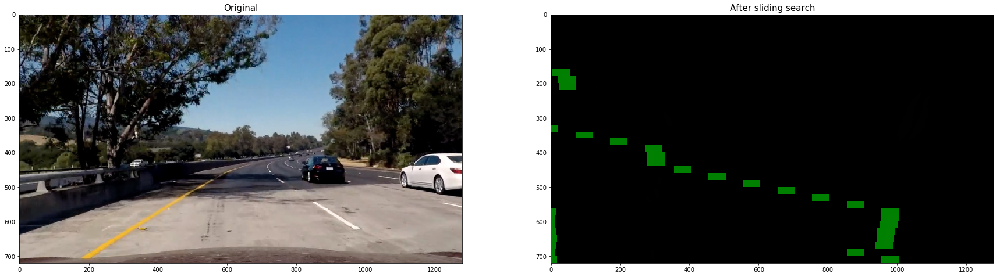

In [27]:
test_img = read_undist("./test_images/test5.jpg")
warped = transform_ROI_warp(test_img)

# window settings
window_width = 50
window_height = 20  # Break image into 9 vertical layers since image height is 720
margin = 100  # How much to slide left and right for searching

output = sliding_search(warped, window_width, window_height, margin)
plot_two_images(test_img, "Original", output, "After sliding search")

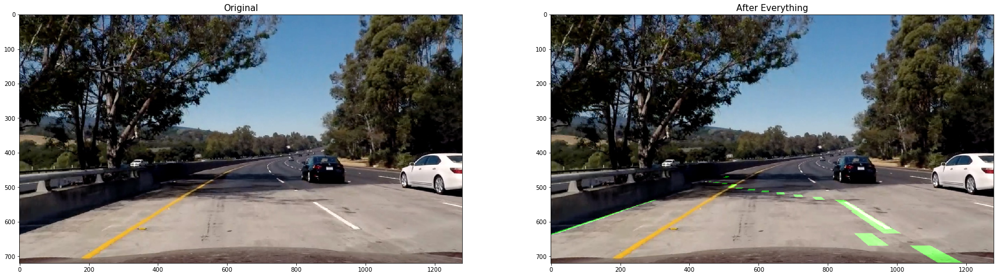

In [28]:
output_unwarped = unwarper(output)
output_unwarped = cv2.addWeighted(test_img, 1.0, output_unwarped, 1.0, 0.0)
plot_two_images(test_img, "Original", output_unwarped, "After Everything")

## Sliding window (Histogram)

In [83]:
def polynomial(x, params):
    """Returns a polynomial

    y = ax^2 + bx + c

    Parameters
    ----------
    x : 1-D array

    params : list
        [a, b, c]

    Returns
    ----------
    list : 1-D array
        Polynomial values
    """    
    a, b, c = params
    return a * x**2 + b * x + c

def sliding_window_search(image):
    """Returns line information

    That is ploty, left_fit, left_fitx, right_fit, right_fitx

    Parameters
    ----------
    image : 2-D array (H, W)

    Returns
    ----------
    left_fit, right_fit : list
        [a, b, c] for polynomial
        such that a x**2 + b * x + c

    left_fitx, rigth_fitx : list
        x data fitted to the `left_fit`

        left_fitx = a * x**2 + b * x + c        
    """
    binary_warped = np.copy(image)
    H, W = np.shape(binary_warped)
    H_half = int(H / 2)
    W_half = int(W / 2)
    histogram = np.sum(binary_warped[H_half:, :], axis=0)

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = W_half
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 40

    # Set height of windows
    window_height = np.int(H / nwindows)

    # Identify the x and y positions of all nonzero pixels in the image

    nonzero = np.nonzero(binary_warped)
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 100

    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = H - (window + 1) * window_height
        win_y_high = H - window * window_height

        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin

        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        cv2.rectangle(out_img,
                      pt1=(win_xleft_low, win_y_low),
                      pt2=(win_xleft_high, win_y_high),
                      color=(0, 255, 0),
                      thickness=2)

        cv2.rectangle(out_img,
                      pt1=(win_xright_low, win_y_low),
                      pt2=(win_xright_high, win_y_high),
                      color=(0, 255, 0),
                      thickness=2)

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = np.nonzero((nonzeroy >= win_y_low)
                                    & (nonzeroy < win_y_high)
                                    & (nonzerox >= win_xleft_low)
                                    & (nonzerox < win_xleft_high))[0]

        good_right_inds = np.nonzero((nonzeroy >= win_y_low)
                                     & (nonzeroy < win_y_high)
                                     & (nonzerox >= win_xright_low)
                                     & (nonzerox < win_xright_high))[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean
        # position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))

        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, H - 1, H)

    left_fitx = polynomial(ploty, left_fit)
    right_fitx = polynomial(ploty, right_fit)

    # left_fit, left_fitx, right_fit, right_fitx
    return left_fit, left_fitx, right_fit, right_fitx

def check_diff(new_fit, old_fit):
    """Returns a fit difference percentage
    
    If a difference is too large, probably wrong fit
    
    Parameters
    ----------
    new_fit : list
    old_fit : list
    
    Returns
    ----------
    diff_percent : float
    """
    assert type(new_fit) == np.ndarray
    assert type(old_fit) == np.ndarray
    np.testing.assert_equal(new_fit.shape, old_fit.shape)
    
    diff = new_fit - old_fit
    percent = np.max(np.abs(diff / old_fit))
    
    return percent    
    
    
    
def sliding_search_cached(image, left_fit, right_fit):
    """Skip the sliding windows step once you know where the lines are

    Parameters
    -----------
    image : 2-D array (H, W)

    left_fit : list
        Previous left line fit

    right_fit : list
        Previous right line fit        

    Returns
    ----------
    left_fit, right_fit : list
    left_fitx, rigth_fitx : list    
    """
    
    nonzero = np.nonzero(image)
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy**2) + left_fit[1] * nonzeroy + left_fit[2] - margin)) & (
        nonzerox < (left_fit[0] * (nonzeroy**2) + left_fit[1] * nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0] * (nonzeroy**2) + right_fit[1] * nonzeroy + right_fit[2] - margin)) & (
        nonzerox < (right_fit[0] * (nonzeroy**2) + right_fit[1] * nonzeroy + right_fit[2] + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    if len(lefty) == 0 or len(leftx) == 0:
        new_left_fit = np.array([0, 0, 0])
    else:
        new_left_fit = np.polyfit(lefty, leftx, 2)
    
    if len(righty) == 0 or len(rightx) == 0:
        new_right_fit = np.array([0, 0, 0])
    else:
        new_right_fit = np.polyfit(righty, rightx, 2)
    
    if check_diff(new_left_fit, left_fit) < 0.05:
        left_fit = new_left_fit
    else:
        left_fit = left_fit * 0.95 + new_left_fit * 0.05
    
    if check_diff(new_right_fit, right_fit) < 0.05:
        right_fit = new_right_fit
    else:
        right_fit = right_fit * 0.95 + new_right_fit * 0.05
            
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, image.shape[0] - 1, image.shape[0])
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
    
    return left_fit, left_fitx, right_fit, right_fitx


def draw_line(binary_warped, left_fitx, right_fitx, margin):
    H, W = binary_warped.shape
    window_img = np.zeros((H, W, 3))
    ploty = np.linspace(0, H - 1, H)
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
    # cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    # cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    points = np.hstack((left_line_window1, right_line_window2))
    cv2.fillPoly(window_img, np.int_([points]), (0, 255, 0))
        
    return np.uint8(window_img)

# Detecting Curvature

In [84]:
def get_curvature(ploty, left_fitx, right_fitx, img_shape):
    """Get curvature radius
    
    Parameters
    ----------
    ploty : 1-D array (H,)
    left_fitx : array_like
    right_fitx : array_like
    
    Returns
    ----------
    left_curverad : float
    right_curverad : float    
    """
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30 / 720  # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700  # meters per pixel in x dimension
    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty * ym_per_pix, left_fitx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty * ym_per_pix, right_fitx * xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix +
                           left_fit_cr[1])**2)**1.5) / np.absolute(2 * left_fit_cr[0])
    right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix +
                            right_fit_cr[1])**2)**1.5) / np.absolute(2 * right_fit_cr[0])
    
    img_height = img_shape[0] * ym_per_pix
    img_width = img_shape[1] * xm_per_pix
    
    left = left_fit_cr[0] * img_height ** 2 + left_fit_cr[1] * img_height + left_fit_cr[2]
    right = right_fit_cr[0] * img_height ** 2 + right_fit_cr[1] * img_height + right_fit_cr[2]
    center = (left + right) / 2.0
    
    off_center = (center - img_width / 2.0)
    
    # Now our radius of curvature is in meters
    return left_curverad, right_curverad, off_center

def detect_line_pipeline(image, left_fit=None, right_fit=None, margin=10):
    """Returns an image with the lines, left_fit, right_fit
    
    Parameters
    ----------
    image : 3-D array (H, W, C)
        Undistorted image
    
    left_fit, right_fit : list (default: None)
    
    margin : int
        Margin for drawing lines
        
    Returns
    ----------
    image : 3-D array (H, W, C)
    left_fit : list
    right_fit : list
    """
    warped = transform_ROI_warp(image)
    H, W = warped.shape
    out_img = np.zeros((H, W, 3), dtype=np.uint8)
    
    if left_fit is not None and right_fit is not None:
        try:
            left_fit, left_fitx, right_fit, right_fitx = sliding_search_cached(warped, left_fit, right_fit)
        except TypeError:
            left_fit, left_fitx, right_fit, right_fitx = sliding_window_search(warped)
    else:
        left_fit, left_fitx, right_fit, right_fitx = sliding_window_search(warped)
    left_curverad, right_curverad, off_center = get_curvature(np.linspace(0, H - 1, H),
                                                              left_fitx,
                                                              right_fitx,
                                                              (H, W))
    
    msg = ["Curvature of Radius : {:>5.2f} m".format(np.mean([left_curverad, right_curverad])),
           "Distance from Center: {:>5.2f} m".format(off_center)]
    
    image = cv2.putText(image, msg[0], (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 255), 3)
    image = cv2.putText(image, msg[1], (20, 100), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 255), 3)
    result = draw_line(warped, left_fitx, right_fitx, margin)
    result = unwarper(result)
    result = cv2.addWeighted(image, 1.0, result, 0.5, 0)
    
    return result, left_fit, right_fit

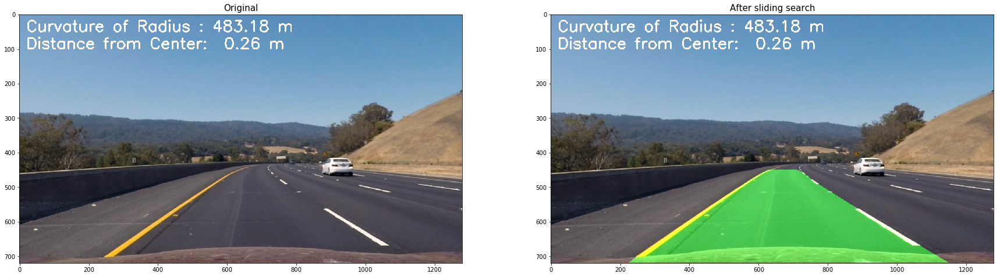

In [85]:
test_img = read_undist("./test_images/test3.jpg")
output, left_fit, right_fit = detect_line_pipeline(test_img)
plot_two_images(test_img, "Original", output, "After sliding search")

# Final Pipeline

In [86]:
left_fit = None
right_fit = None

def pipeline(image):
    global left_fit, right_fit
    
    image = undistort(image)
    image, left_fit, right_fit = detect_line_pipeline(image, left_fit, right_fit)    
    
    return image

In [87]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

output = 'output.mp4'
clip1 = VideoFileClip("./project_video.mp4", audio=False)
clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time clip.write_videofile(output, audio=False, progress_bar=False)

[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4
[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 

CPU times: user 3min 37s, sys: 25.5 s, total: 4min 2s
Wall time: 1min 45s


In [88]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))